## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## 1. Compute the camera calibration using chessboard images

In [1]:
#import modules
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from ipywidgets import widgets
%matplotlib inline

#### Find chessboard corners

couldn not find cornerss for ./camera_cal\calibration1.jpg


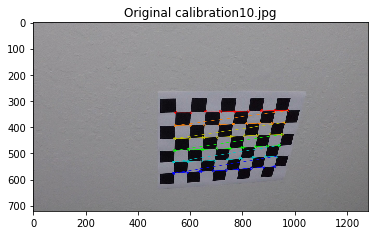

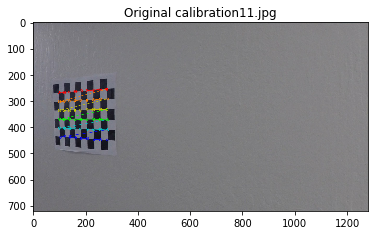

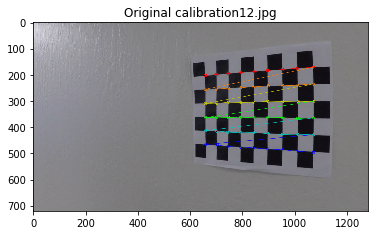

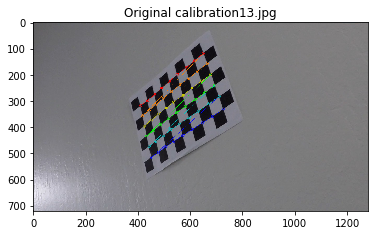

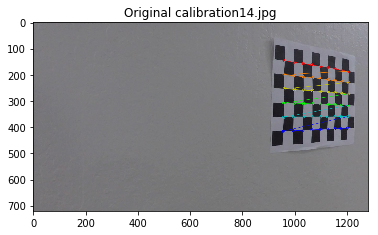

...

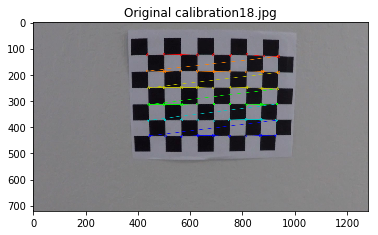

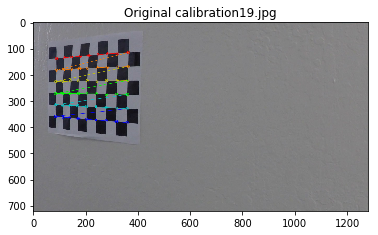

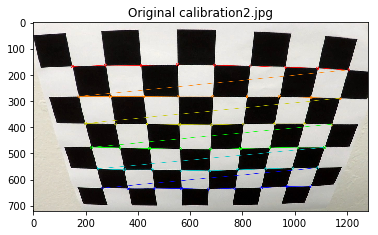

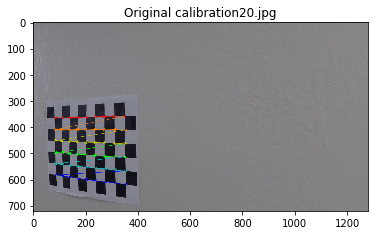

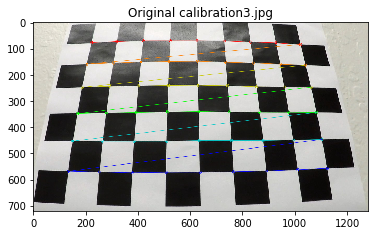

couldn not find cornerss for ./camera_cal\calibration4.jpg
couldn not find cornerss for ./camera_cal\calibration5.jpg


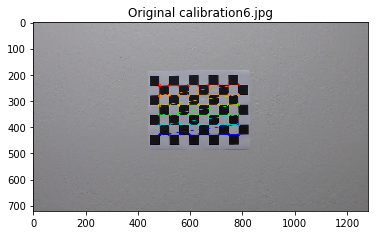

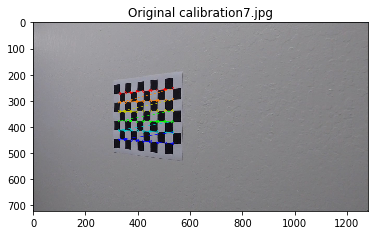

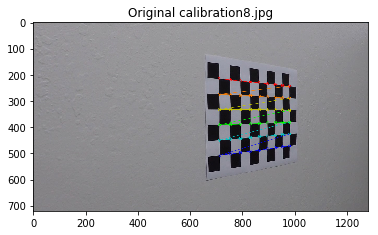

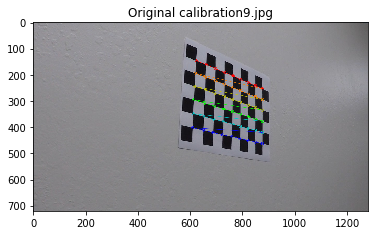

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
nx = 9
ny = 6
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objPoints = [] # 3d points in real world space
imgPoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
imgSize = cv2.imread(images[0]).shape[0:2]

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objPoints.append(objp)
        imgPoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        imageName = fname.split('\\')[-1]
        fig = plt.figure()
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original ' + imageName)
        plt.show()
        cv2.imwrite('./output_images/found_chessboard_corners/' + imageName,img)
    else:
        print('couldn not find cornerss for ' + fname)

#### Find camera calibration parmeters

In [3]:
# Camera calibration parameters
ret, mtx, dist, rvecs, tvecs, = cv2.calibrateCamera(objPoints,imgPoints,imgSize,None,None)
print('The distortion coeeficients are: ' , dist)

The distortion coeeficients are:  [[ -2.41018767e-01  -5.30665431e-02  -1.15811319e-03  -1.28284935e-04
    2.67026162e-02]]


#### Undistort chessboard images to visualize the calibration

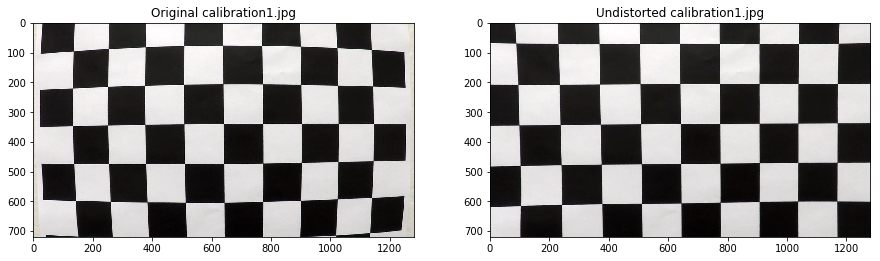

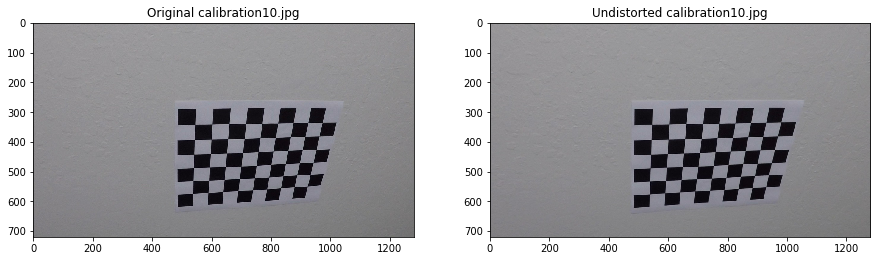

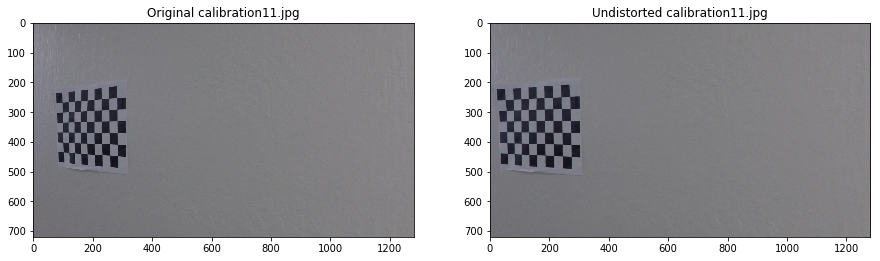

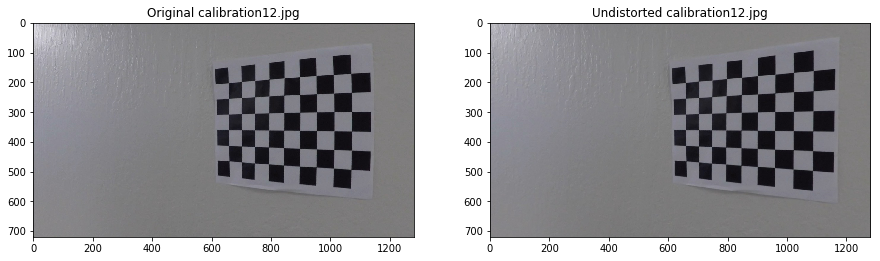

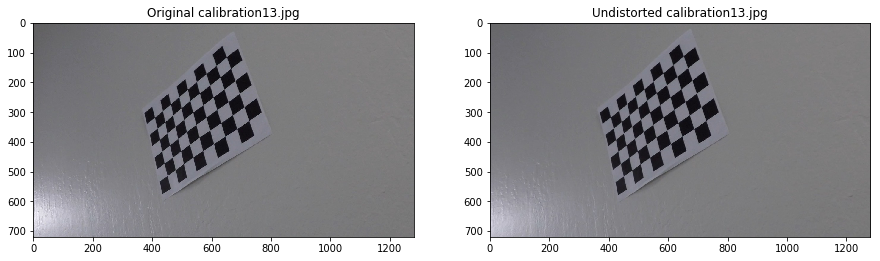

...

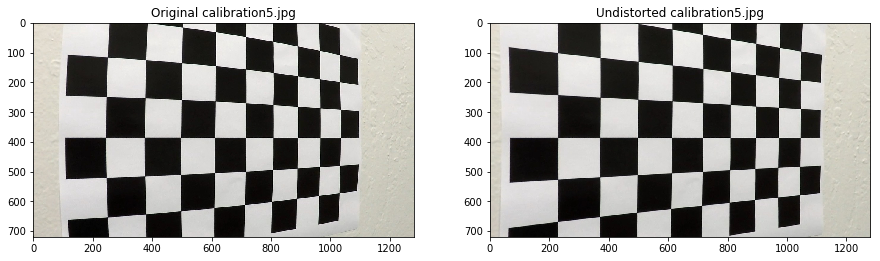

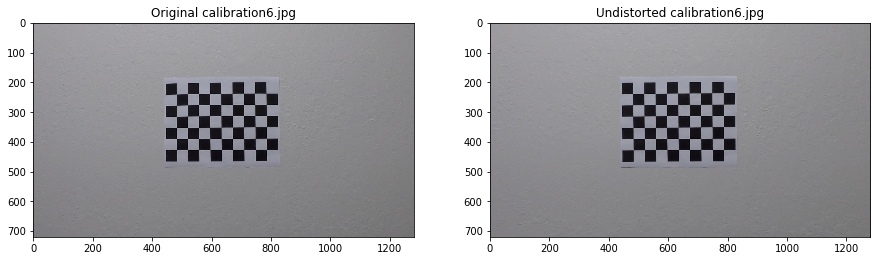

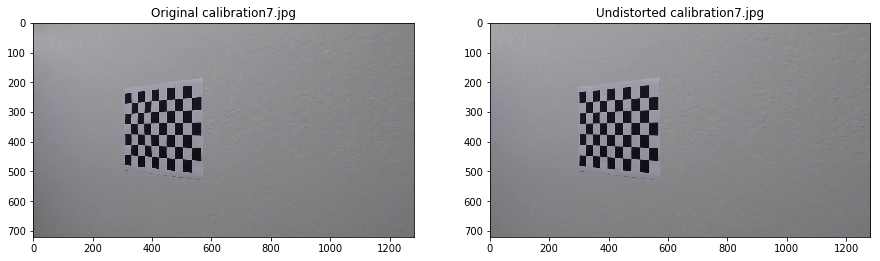

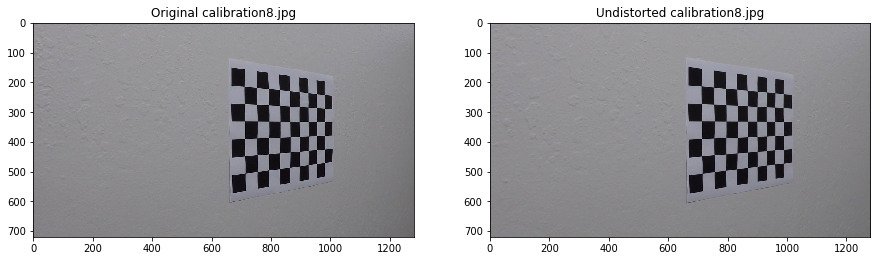

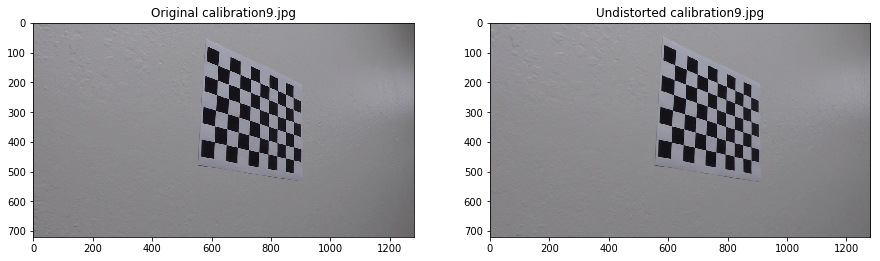

In [4]:
# Undistort the chessboard images in order to check the calibration
for fname in images:
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted ' + imageName)
    plt.show()
    cv2.imwrite('./output_images/undistorted_chessboard/' + imageName,undistorted)

---

## 2. Undistort the raw test images

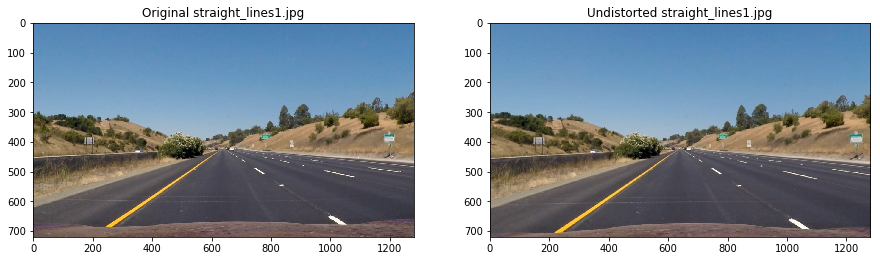

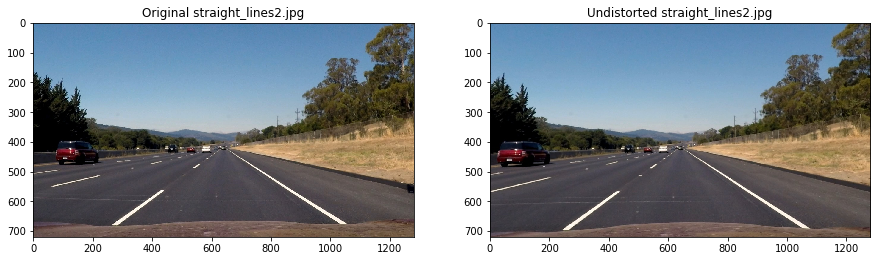

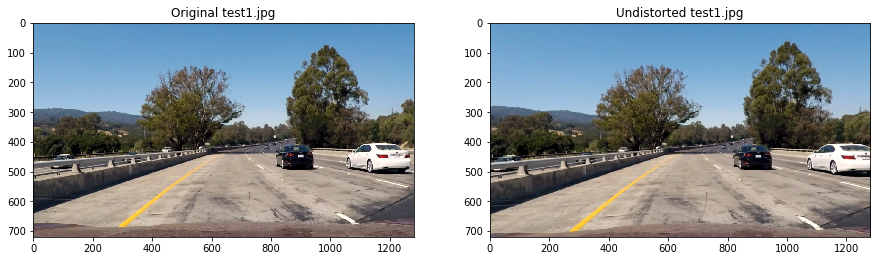

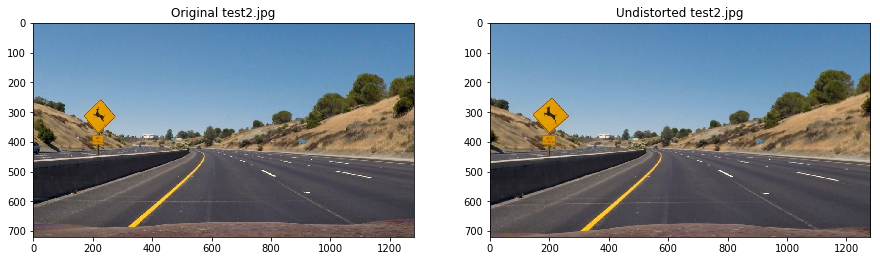

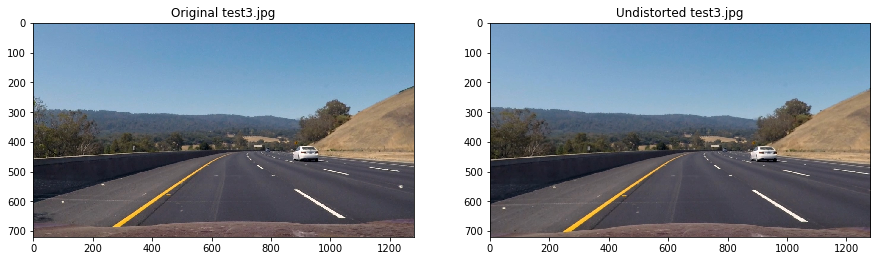

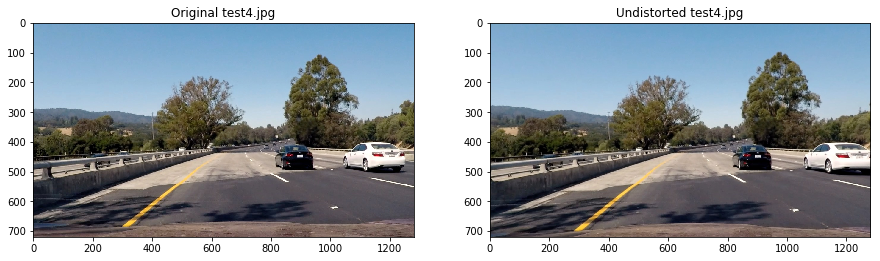

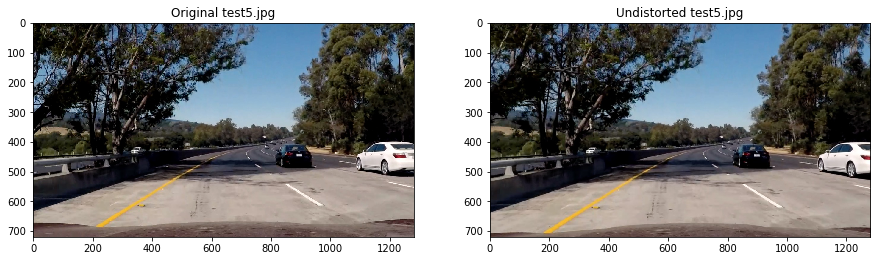

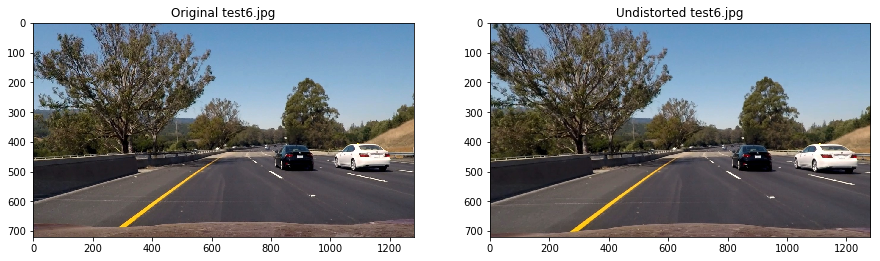

In [5]:
# Make a list of the test images
straightImgs = glob.glob('./test_images/straight_lines*.jpg')
testImgs = glob.glob('./test_images/test*.jpg')

# Undistort images and plot the original and undistorted images
for fname in straightImgs + testImgs:
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted ' + imageName)
    plt.show()
    cv2.imwrite('./output_images/undistorted_test_images/' + imageName,undistorted)


---

## 3. Color transforms and color & gradient thresholding

In [6]:
def bin_channel(channel,low_thresh=1,high_thresh=255):
    # Create a binary image of a channel based on high & low thrwsholds
    binary_out = np.zeros_like(channel,dtype=np.uint8)
    binary_out[(channel >= low_thresh) & (channel < high_thresh)] = 1
    return binary_out

#### Transform BGR to HLS and threshold over the S channel

<function __main__.handle>

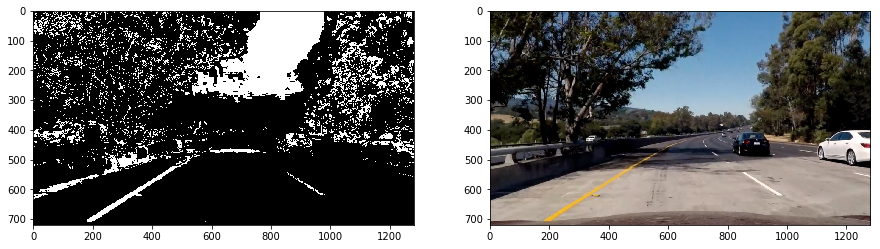

In [7]:
# Make a list of the undistorted test images
straightImgs = glob.glob('./output_images/undistorted_test_images/straight_lines*.jpg')
testImgs = glob.glob('./output_images/undistorted_test_images/test*.jpg')
images = straightImgs + testImgs
image = cv2.imread(images[6])
hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS)
sChannel = hls[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 100, min=0, max=255, step=1)

def handle(highThreshold, lowThreshold):
    binary_out = bin_channel(sChannel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider)

#### Transform BGR to HSV and threshold over the S channel

<function __main__.handle>

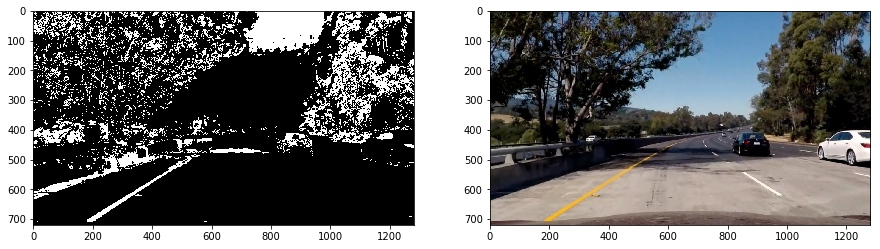

In [8]:
image = cv2.imread(images[6])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
sChannel = hsv[:,:,1]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 120, min=0, max=255, step=1)

def handle(highThreshold, lowThreshold):
    binary_out = bin_channel(sChannel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider)

#### Threshold over the R channel

<function __main__.handle>

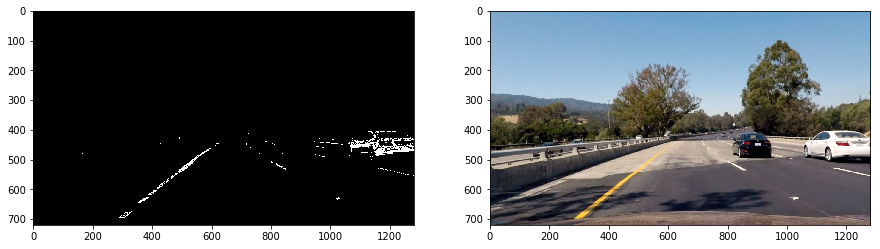

In [9]:
image = cv2.imread(images[5])
rChannel = image[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 230, min=0, max=255, step=1)

def handle(highThreshold, lowThreshold):
    binary_out = bin_channel(rChannel,lowThreshold,highThreshold)   
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider)

#### Add the S and R binaries

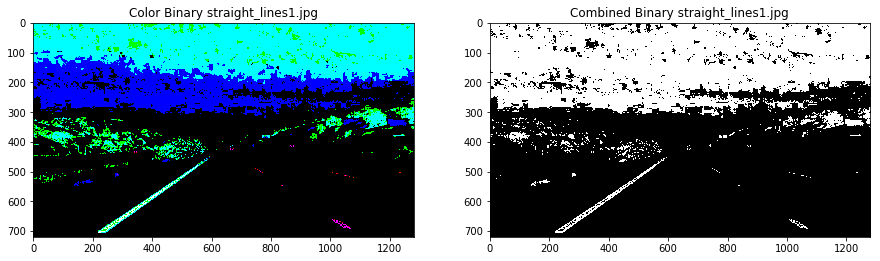

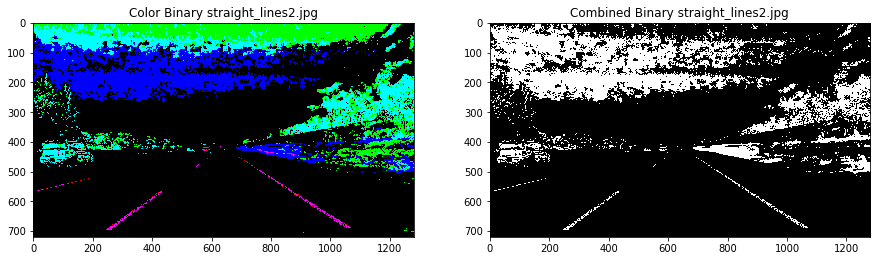

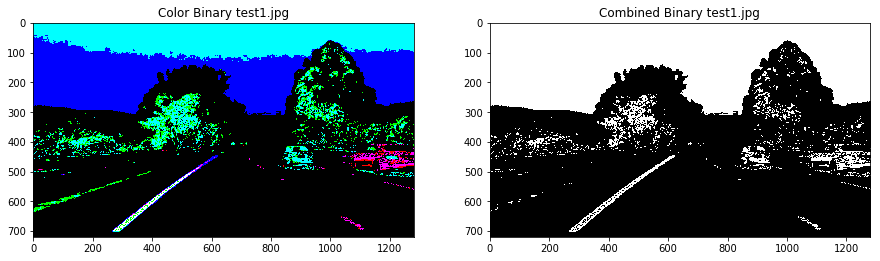

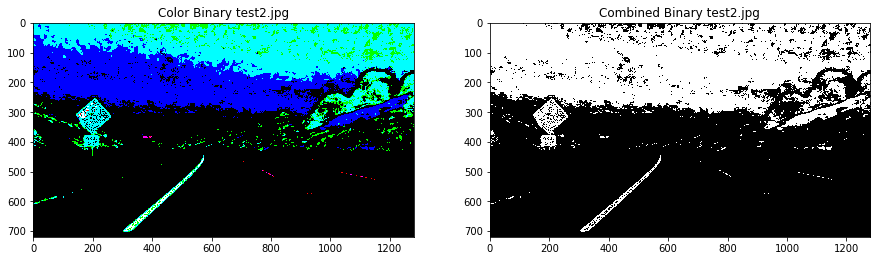

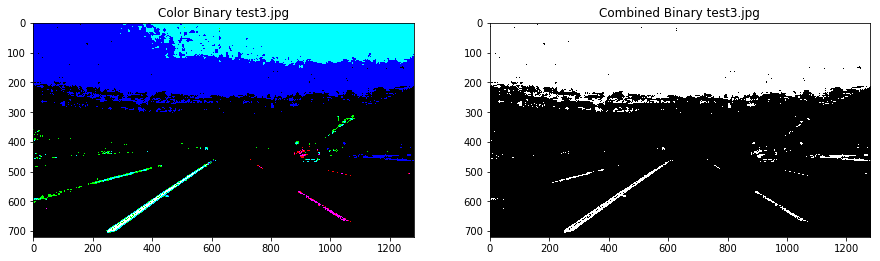

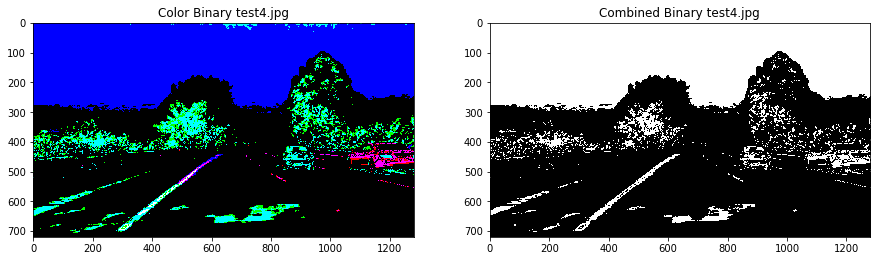

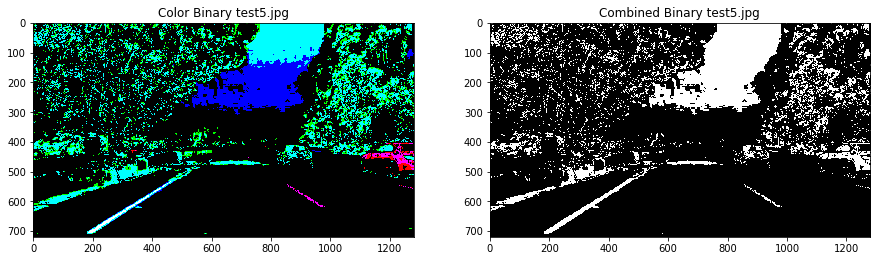

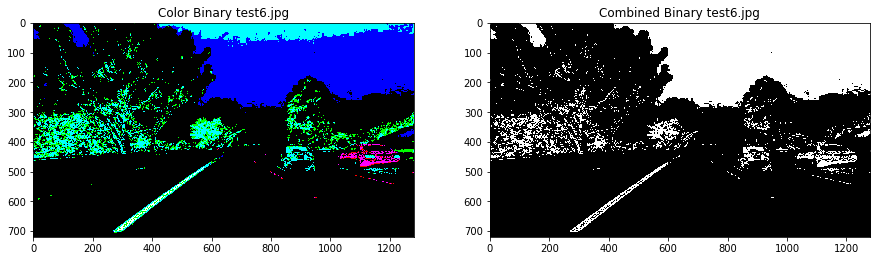

In [10]:
for fname in images:
    image = cv2.imread(fname)
    rChannel = image[:,:,2]
    hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS)
    sChannel = hls[:,:,2]
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    sChannel2 = hsv[:,:,1]

    red_bin = bin_channel(rChannel,230,255)
    s_bin = bin_channel(sChannel,100,255)
    s_bin2 = bin_channel(sChannel2,120,255)
    color_binary = np.dstack((red_bin*255, s_bin2*255, s_bin*255))
    combined_binary = red_bin | s_bin #| s_bin2

    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(color_binary)
    plt.title('Color Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/color_combined_binary/' + imageName[:-3] + 'bmp',combined_binary*255)
    cv2.imwrite('./output_images/colored_binary/' + imageName,cv2.cvtColor(color_binary,cv2.COLOR_RGB2BGR))



#### Apply sobel in x direction (over V channel) and threshold over the output

<function __main__.handle>

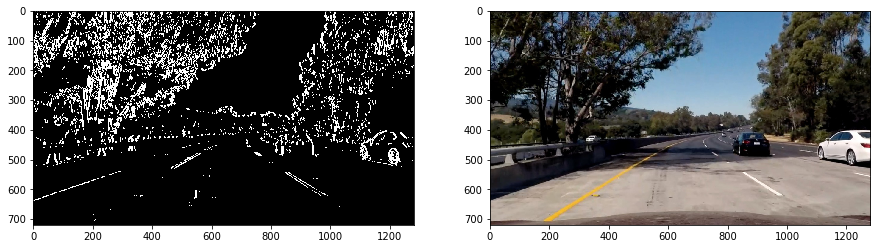

In [11]:
image = cv2.imread(images[6])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 30, min=0, max=255, step=1)
kernel_slider = widgets.IntSlider(value = 11, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobel = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint(255*abs_sobel/np.max(abs_sobel))
    binary_out = bin_channel(scaled_sobel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)


#### Apply sobel in y direction (over V channel) and threshold over the output

<function __main__.handle>

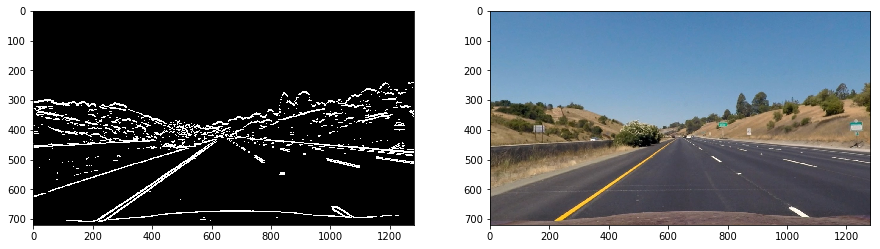

In [12]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 40, min=0, max=255, step=1)
kernel_slider = widgets.IntSlider(value = 11, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobel = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint(255*abs_sobel/np.max(abs_sobel))
    binary_out = bin_channel(scaled_sobel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)

#### Apply sobel in both direction (over V channel) and threshold over the magnitude

<function __main__.handle>

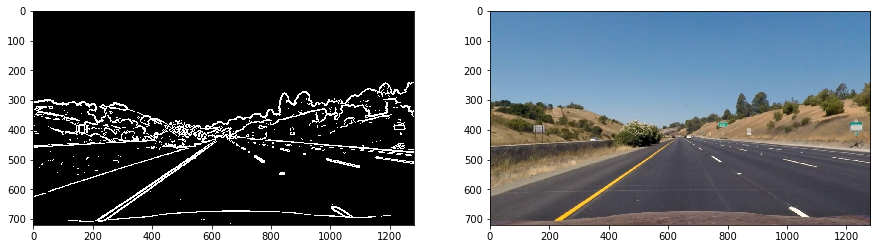

In [13]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 45, min=0, max=255, step=1)
kernel_slider = widgets.IntSlider(value = 11, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=kernel)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=kernel)
    sobMag = np.sqrt(np.square(sobelx)+np.square(sobely))
    scaled_sobel = np.uint(255*sobMag/np.max(sobMag))
    binary_out = bin_channel(scaled_sobel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)

#### Apply sobel in both direction (over V channel) and threshold over the direction

<function __main__.handle>

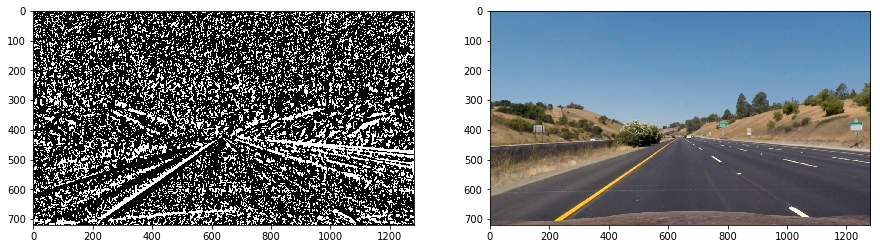

In [14]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.FloatSlider(value = 90, min=-180, max=180, step=1)
low_slider = widgets.FloatSlider(value = 50, min=-180, max=180, step=1)
kernel_slider = widgets.IntSlider(value = 21, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=kernel)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    sobDirection = np.arctan2(sobely,sobelx)
    binary_out1 = bin_channel(sobDirection,lowThreshold*np.pi/180,highThreshold*np.pi/180)
    binary_out2 = bin_channel(sobDirection,-highThreshold*np.pi/180,-lowThreshold*np.pi/180)
    binary_out = binary_out1 | binary_out2
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)

#### Combine x and y thresholds

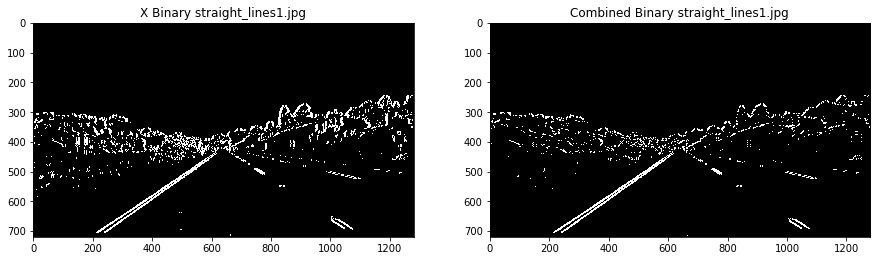

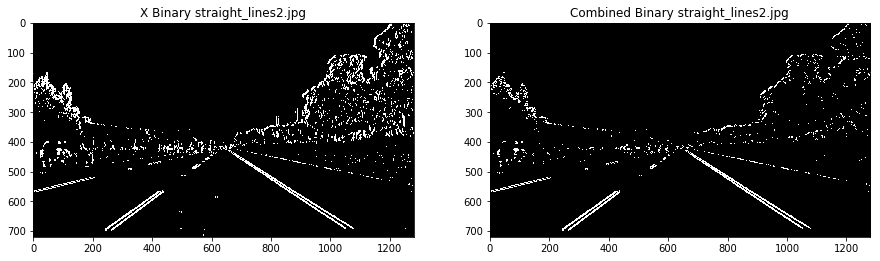

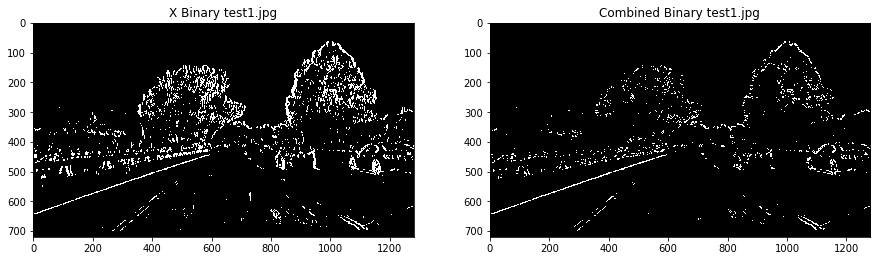

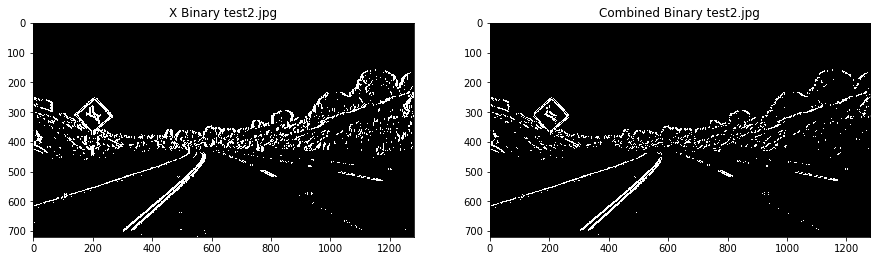

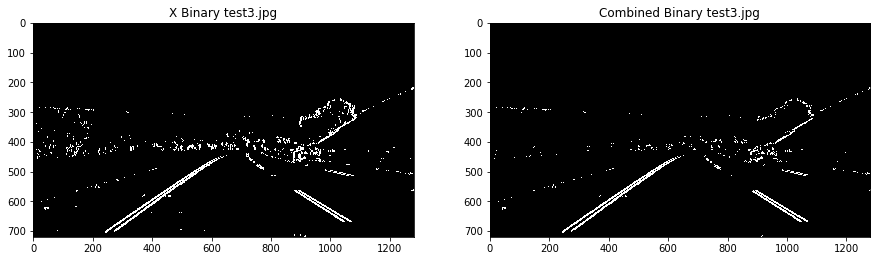

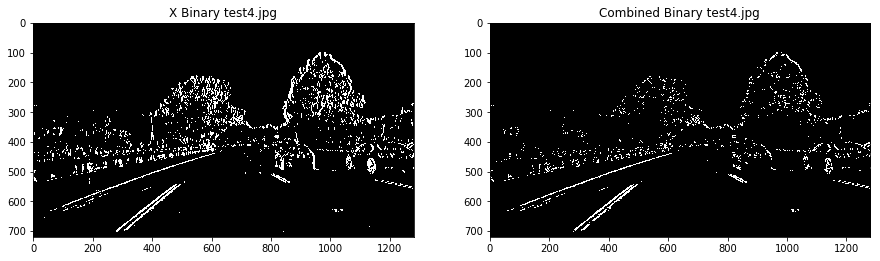

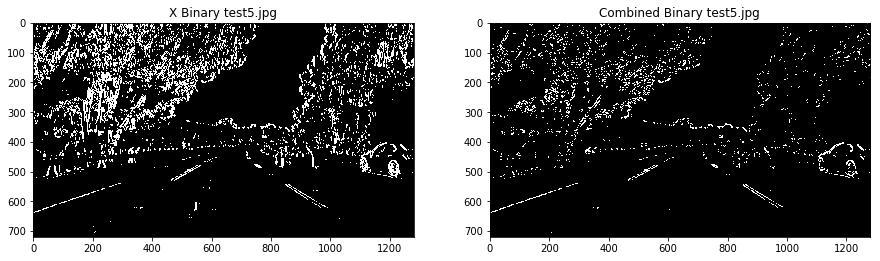

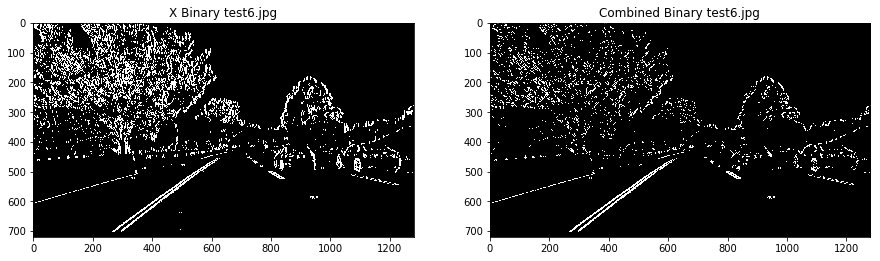

In [15]:
for fname in images:
    image = cv2.imread(fname)
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    vChannel = hsv[:,:,2]
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=11)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=11)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    scaled_sobelx = np.uint(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobely = np.uint(255*abs_sobely/np.max(abs_sobely))
    
    binary_x = bin_channel(scaled_sobelx,30,255)
    binary_y = bin_channel(scaled_sobely,30,255)
    combined_binary = binary_x & binary_y
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_x,cmap='gray')
    plt.title('X Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/combined_x_y/' + imageName[:-3] + 'bmp',combined_binary*255)

#### Combine magnitude and direction thresholds

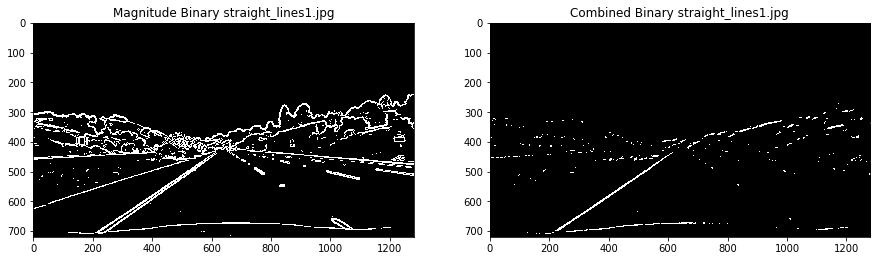

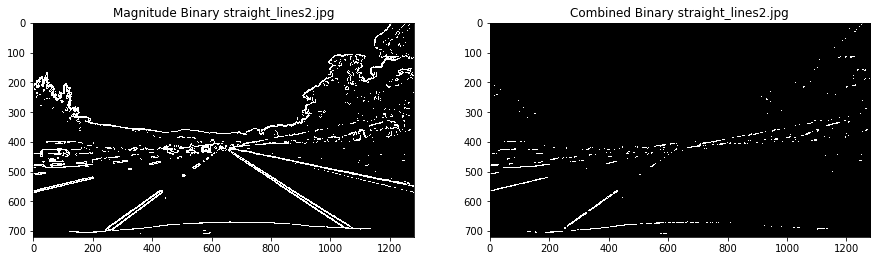

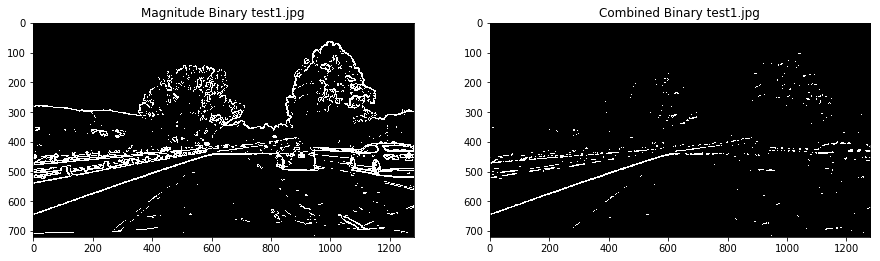

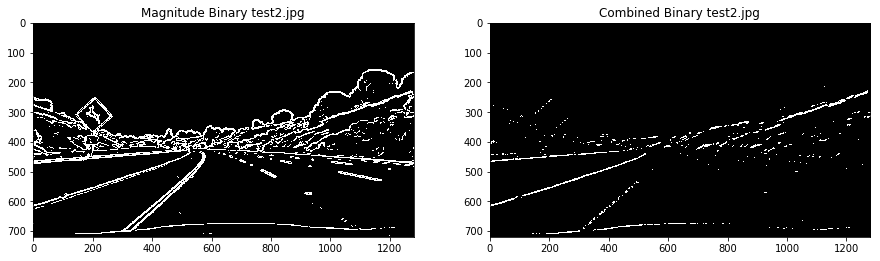

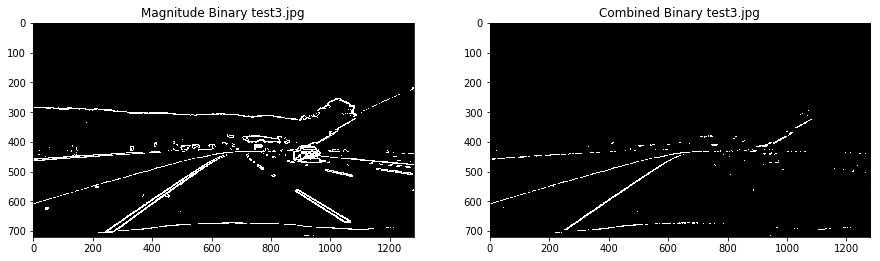

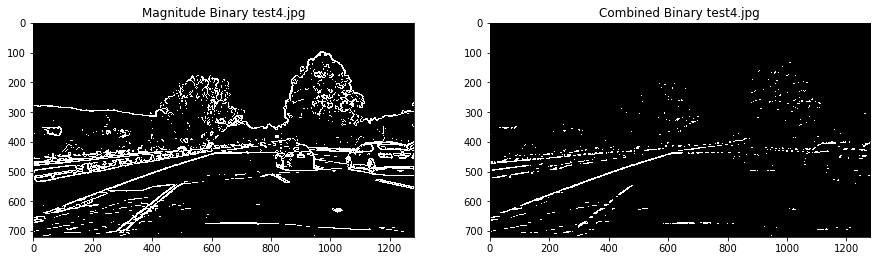

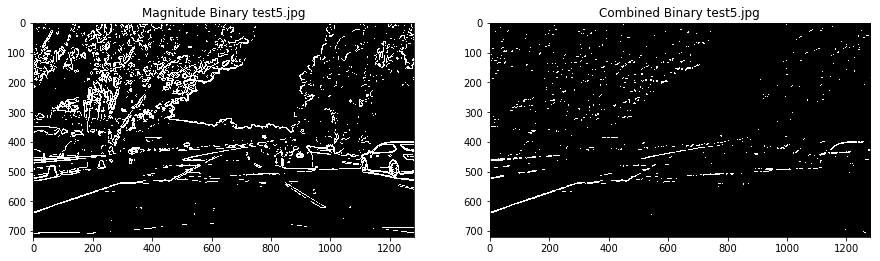

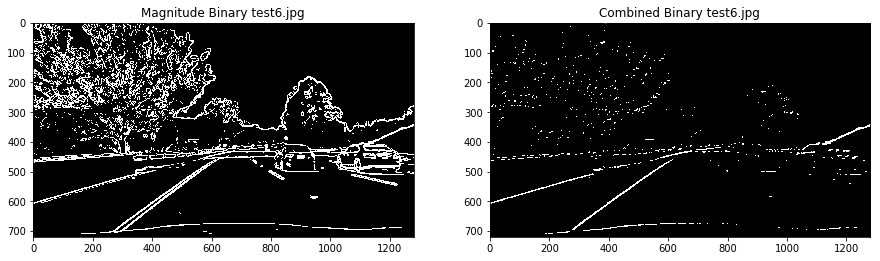

In [16]:
for fname in images:
    image = cv2.imread(fname)
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    vChannel = hsv[:,:,2]
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=11)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=11)
    sobMag = np.sqrt(np.square(sobelx)+np.square(sobely))
    scaledMag = np.uint(255*sobMag/np.max(sobMag))
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=21)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=21)
    sobDirection = np.arctan2(sobely,sobelx)
    
    mag_bin = bin_channel(scaledMag,45,255)
    dir_bin1 = bin_channel(sobDirection,50.0*np.pi/180.0,90*np.pi/180)
    dir_bin2 = bin_channel(mag_bin,-90.0*np.pi/180.0,-50*np.pi/180)
    combined_binary = mag_bin & (dir_bin1 | dir_bin2)
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(mag_bin,cmap='gray')
    plt.title('Magnitude Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/combined_mag_dir/' + imageName[:-3] + 'bmp',combined_binary*255)

#### Combine selecteed thresholds - x and colors

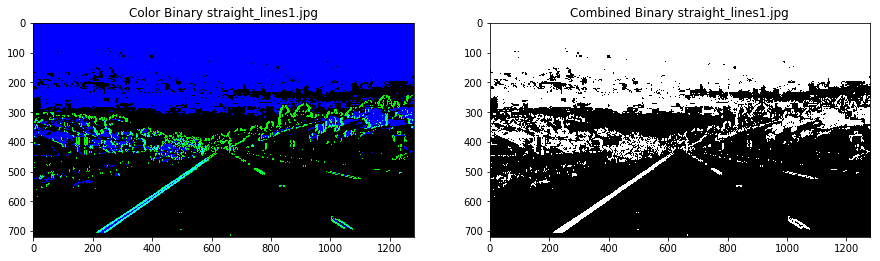

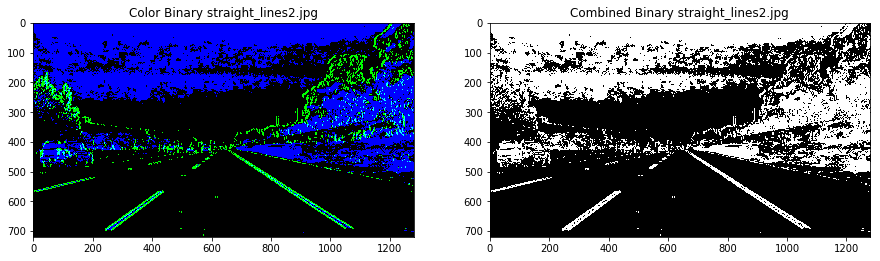

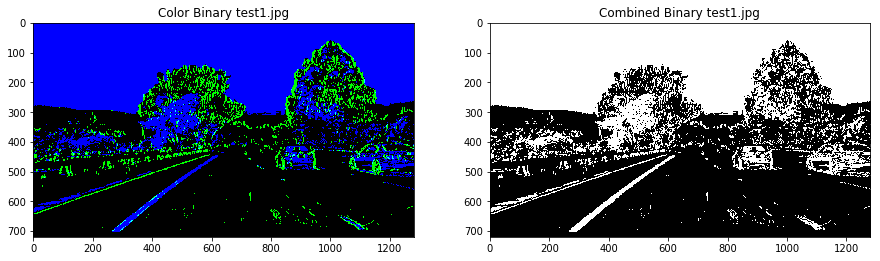

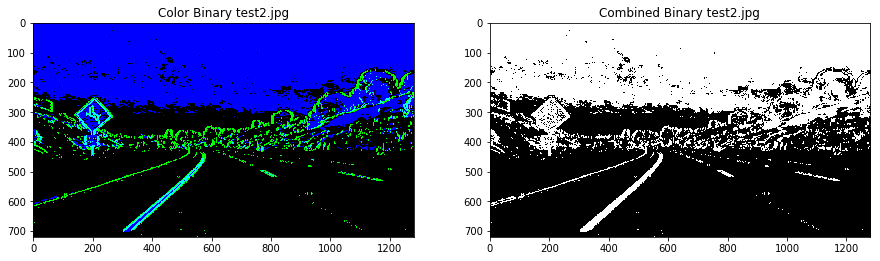

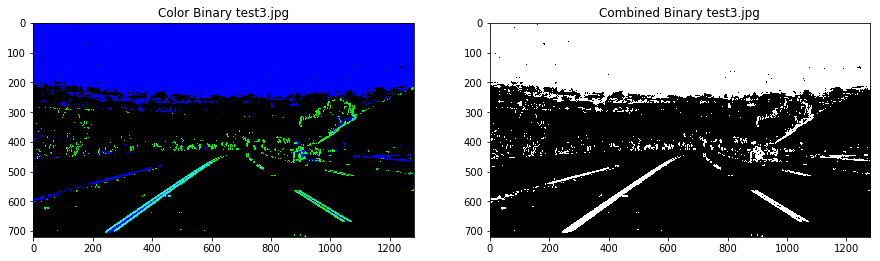

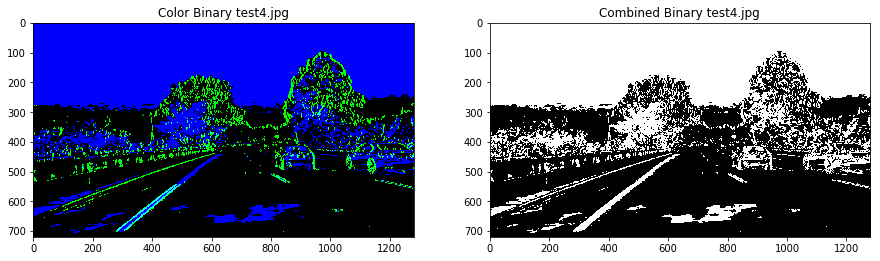

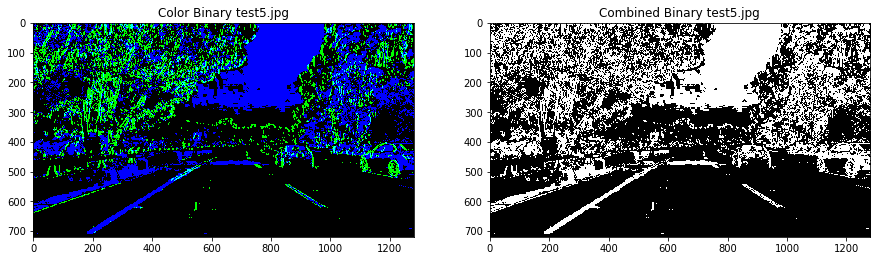

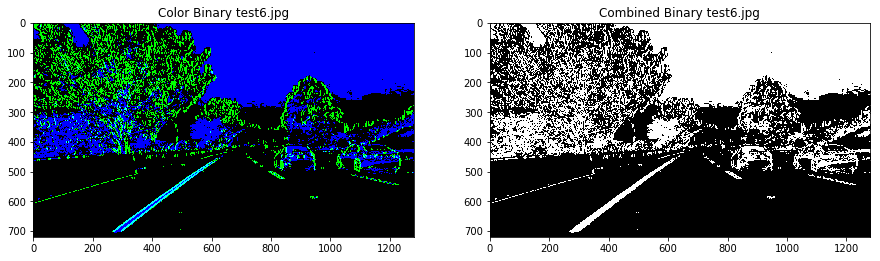

In [17]:
for fname in images:
    image = cv2.imread(fname)
    rChannel = image[:,:,2]
    hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS)
    sChannel = hls[:,:,2]
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    sChannel2 = hsv[:,:,1]
    vChannel = hsv[:,:,2]
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=11)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint(255*abs_sobelx/np.max(abs_sobelx))

    red_bin = bin_channel(rChannel,230,255)
    s_bin = bin_channel(sChannel,100,255)
    s_bin2 = bin_channel(sChannel2,120,255)
    binary_x = bin_channel(scaled_sobelx,30,255)
    combined_color_binary = red_bin | s_bin | s_bin2
    color_binary = np.dstack((np.zeros_like(binary_x), binary_x*255, combined_color_binary*255))
    combined_binary = combined_color_binary | binary_x

    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(color_binary)
    plt.title('Color Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/color_gradient_combined_binary/' + imageName[:-3] + 'bmp',combined_binary*255)
    cv2.imwrite('./output_images/color_gradient_colored_binary/' + imageName, cv2.cvtColor(color_binary,cv2.COLOR_RGB2BGR))


## Crop

In [18]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

<function __main__.handle>

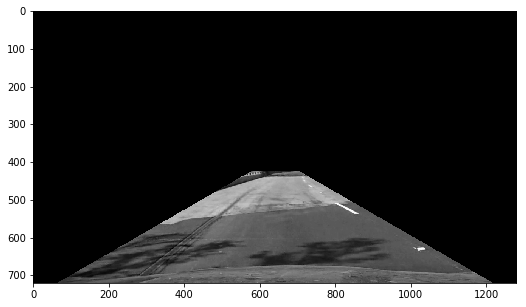

In [19]:
#####----Choosing vertices for fillpoly with widgets----#####
# Choose the vertices as a percentage out of the image shape #
# define sliders
img = cv2.imread(images[5])[:,:,0]
imageShape = img.shape
x0_slider = widgets.FloatSlider(value = 0.95, min=0, max=1, step=0.01)
y0_slider = widgets.FloatSlider(value = 1.,min=0, max=1, step=0.01)
x1_slider = widgets.FloatSlider(value = 0.05,min=0, max=1, step=0.01)
y1_slider = widgets.FloatSlider(value = 1.,min=0, max=1, step=0.01)
x2_slider = widgets.FloatSlider(value = 0.45,min=0, max=1, step=0.01)
y2_slider = widgets.FloatSlider(value = 0.59,min=0, max=1, step=0.01)
x3_slider = widgets.FloatSlider(value = 0.55,min=0, max=1, step=0.01)
y3_slider = widgets.FloatSlider(value = 0.59,min=0, max=1, step=0.01)

def handle(x0, y0, x1, y1, x2, y2, x3, y3):
    vertices = np.array([[(x0*imageShape[1],y0*imageShape[0]),
                          (x1*imageShape[1],y1*imageShape[0]),
                          (x2*imageShape[1],y2*imageShape[0]),
                          (x3*imageShape[1],y3*imageShape[0])]], dtype=np.int32)
    maskedImage = region_of_interest(img,vertices)
    plt.figure(figsize = (9,5))
#     plt.imshow(cv2.cvtColor(maskedImage, cv2.COLOR_BGR2RGB))
    plt.imshow(maskedImage,cmap='gray')

widgets.interact(handle, x0=x0_slider, y0=y0_slider, x1=x1_slider, y1=y1_slider, x2=x2_slider, y2=y2_slider, x3=x3_slider, y3=y3_slider,)

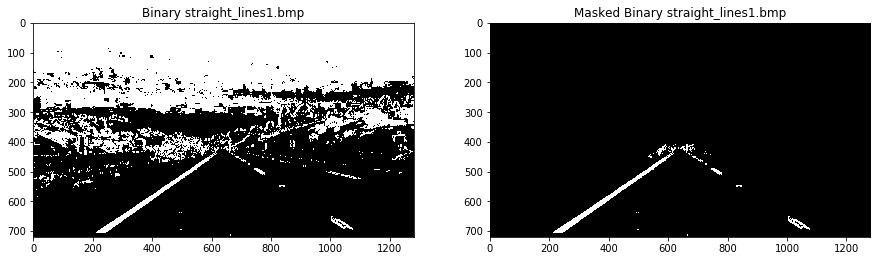

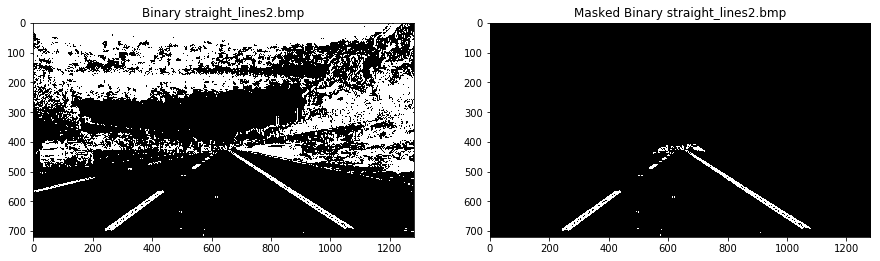

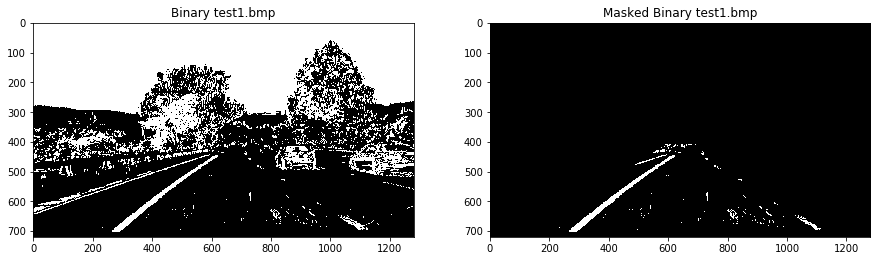

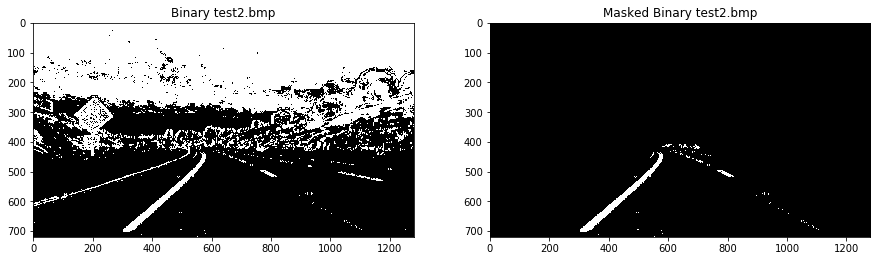

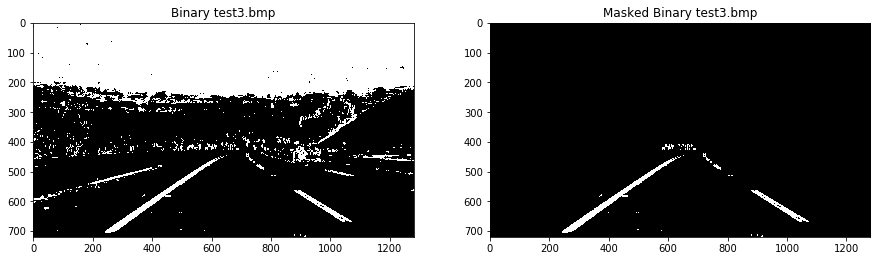

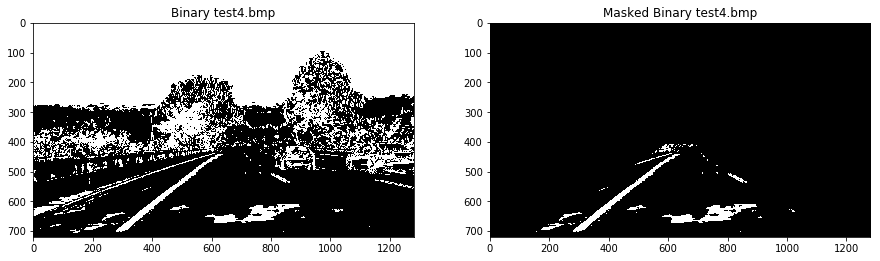

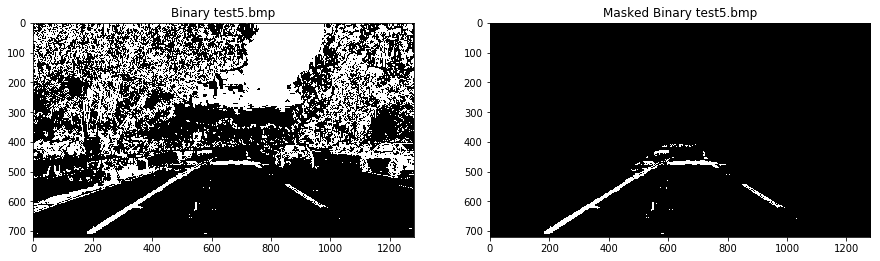

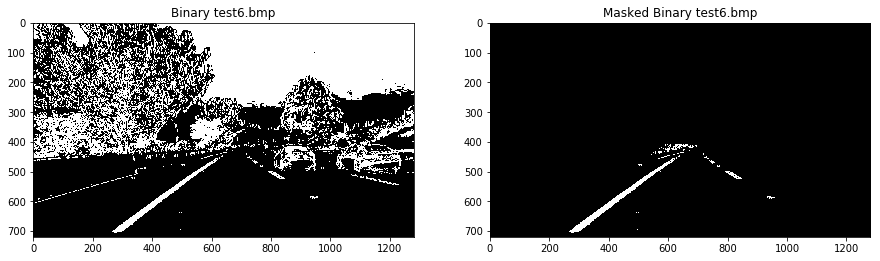

In [20]:
#####----Define vertices----#####
binaries = glob.glob('./output_images/color_gradient_combined_binary/*.bmp')
vertices = np.array([[(0.9*imageShape[1],imageShape[0]),(0.1*imageShape[1],imageShape[0]),(0.46*imageShape[1],0.57*imageShape[0]),(0.54*imageShape[1],0.57*imageShape[0])]],dtype=np.int32)

for fname in binaries:
    image = cv2.imread(fname)
    maskedImage = region_of_interest(image,vertices)
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(image,cmap='gray')
    plt.title('Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(maskedImage,cmap='gray')
    plt.title('Masked Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/color_gradient_colored_masked_binary/' + imageName, maskedImage)


## 4. Apply a perspective transform to rectify binary image 

#### Choose the 4 points

In [21]:
# %matplotlib qt
# 
# straightBin = glob.glob('./output_images/color_gradient_combined_binary/straight_lines*.bmp')
# img = cv2.imread(straightBin[0])[:,:,0]
# plt.imshow(img,cmap='gray')

# Chosen 4 points
# bot_left = [261,680]
# top_left = [585,457]
# top_right = [698,457]
# bot_right = [1044,680]
bot_left = [261,680]
top_left = [555,477]
top_right = [730,477]
bot_right = [1044,680]

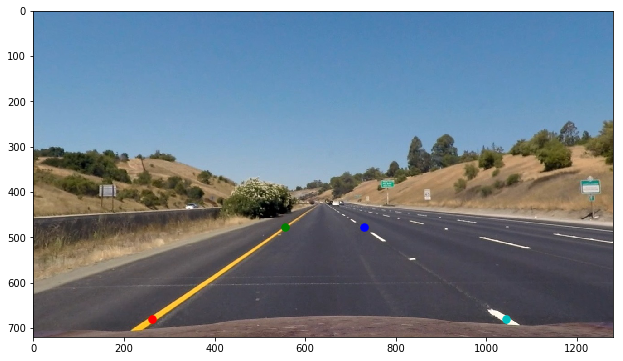

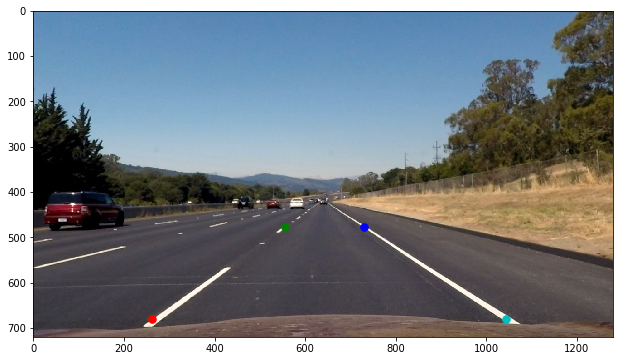

In [22]:
%matplotlib inline

for fname in straightImgs:
    img = cv2.imread(fname)
    fig = plt.figure(figsize = (12,6))
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.plot(bot_left[0],bot_left[1],'r.',markersize=15.0)
    plt.plot(top_left[0],top_left[1],'g.',markersize=15.0)
    plt.plot(top_right[0],top_right[1],'b.',markersize=15.0)
    plt.plot(bot_right[0],bot_right[1],'c.',markersize=15.0)
    imageName = fname.split('\\')[-1]
    plt.savefig('./output_images/chosen_points/' + imageName)

#### Transform the straight line images and check if they are indeed straight

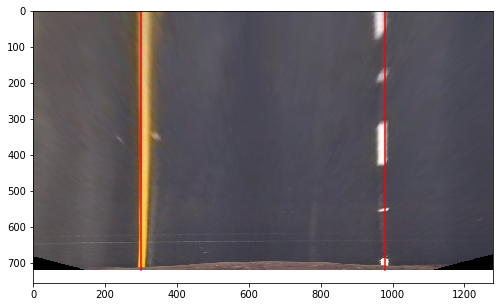

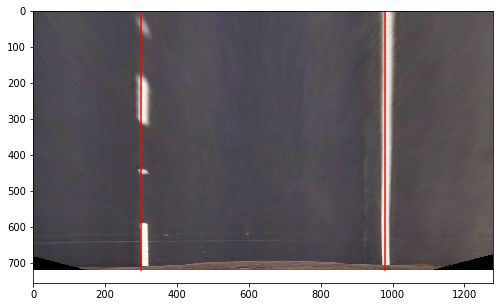

In [23]:
src = np.float32([bot_left,top_left,top_right,bot_right])
dst = np.float32([[300,700],[300,200],[980,200],[980,700]])
M = cv2.getPerspectiveTransform(src,dst)
Minv = cv2.getPerspectiveTransform(dst,src)

for fname in straightImgs:
    img = cv2.imread(fname)
    image_size = (img.shape[1],img.shape[0])
    warped = cv2.warpPerspective(img,M,image_size,flags=cv2.INTER_LINEAR)
    fig = plt.figure(figsize = (10,5))
    plt.imshow(cv2.cvtColor(warped,cv2.COLOR_BGR2RGB))
    plt.plot([300,300],[0,720],'r')
    plt.plot([980,980],[0,720],'r')

#### Transform all images to see the curvature

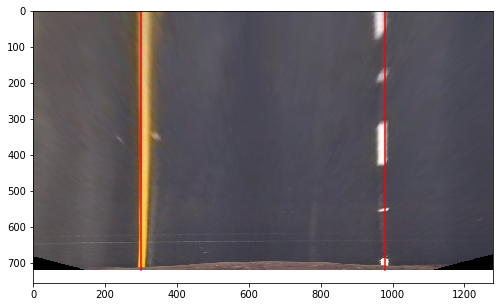

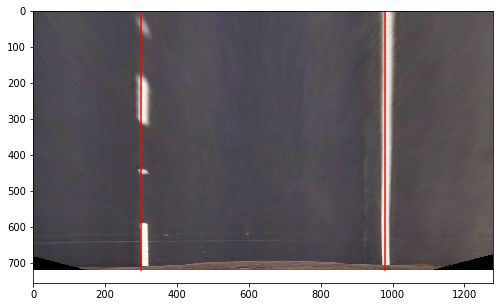

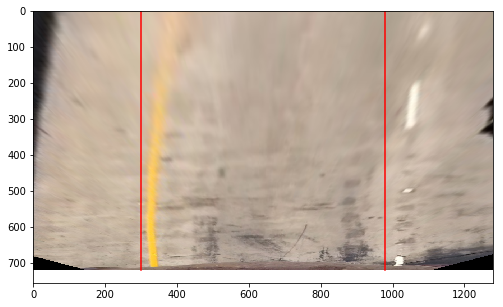

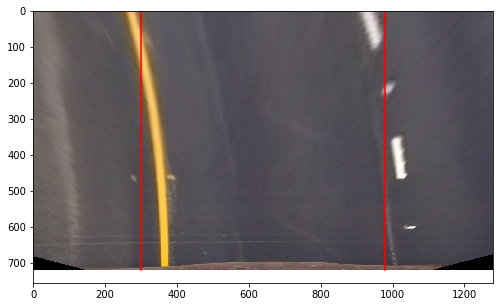

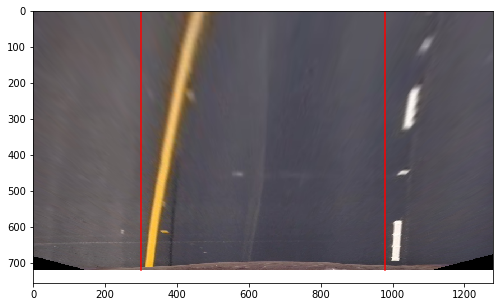

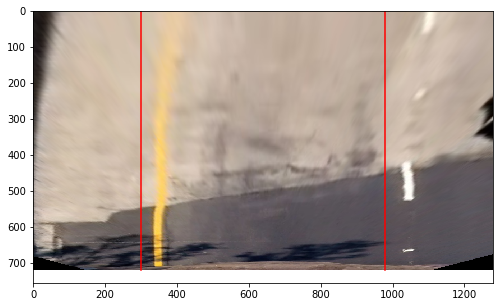

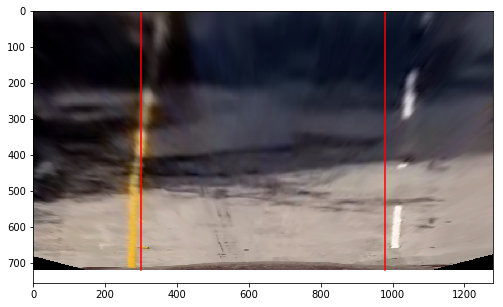

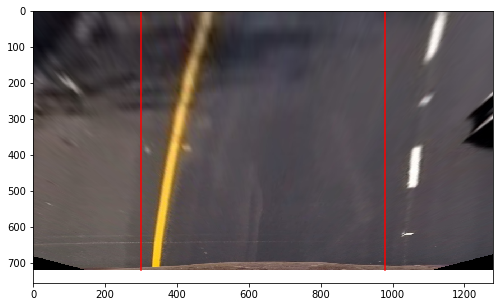

In [24]:
for fname in images:
    img = cv2.imread(fname)
    image_size = (img.shape[1],img.shape[0])
    warped = cv2.warpPerspective(img,M,image_size,flags=cv2.INTER_LINEAR)
    fig = plt.figure(figsize = (10,5))
    plt.imshow(cv2.cvtColor(warped,cv2.COLOR_BGR2RGB))
    plt.plot([300,300],[0,720],'r')
    plt.plot([980,980],[0,720],'r')
    imageName = fname.split('\\')[-1]
    plt.savefig('./output_images/transformed_images/' + imageName)
    

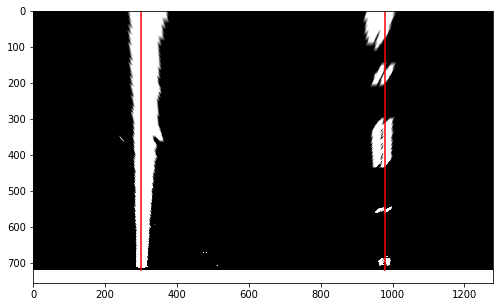

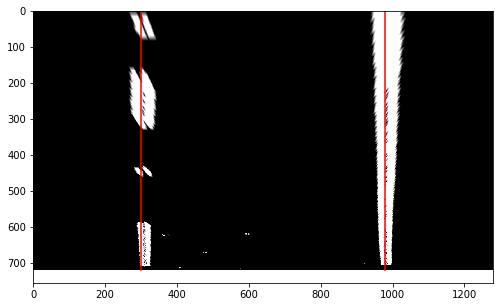

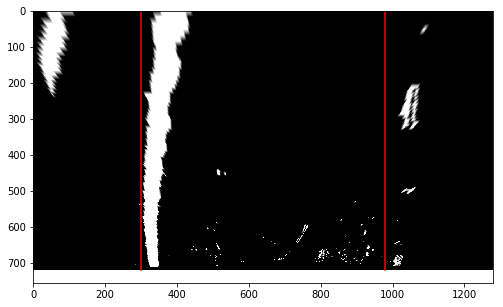

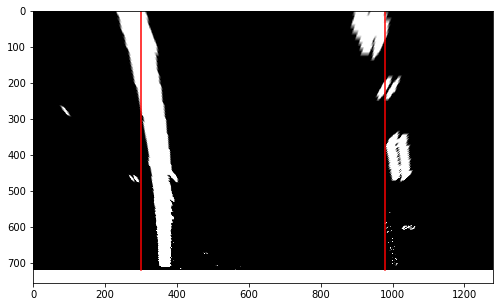

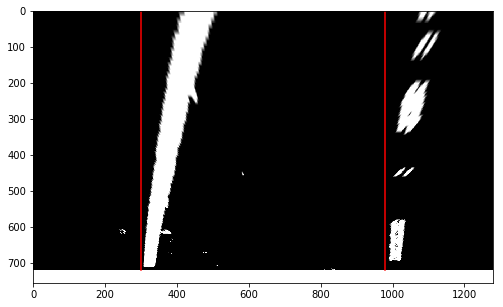

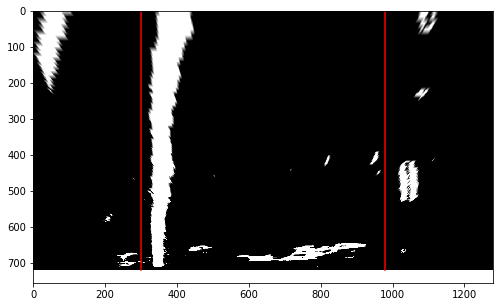

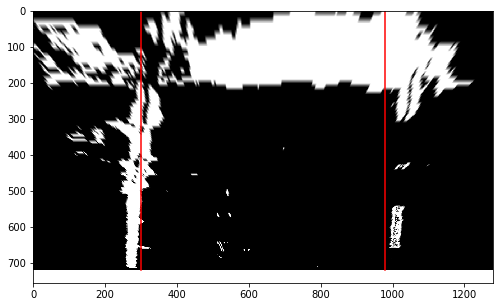

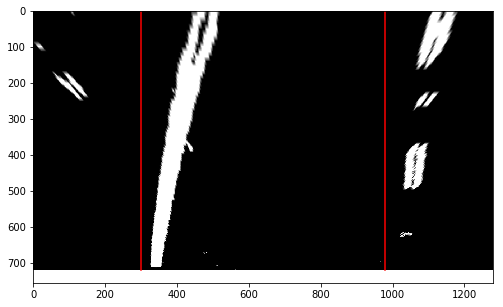

In [25]:
binaries = glob.glob('./output_images/color_gradient_combined_binary/*.bmp')
for fname in binaries:
    img = cv2.imread(fname)[:,:,0]
    image_size = (img.shape[1],img.shape[0])
    maskedImage = region_of_interest(img,vertices)
    warped = cv2.warpPerspective(maskedImage,M,image_size,flags=cv2.INTER_LINEAR)
    fig = plt.figure(figsize = (10,5))
    plt.imshow(warped,cmap='gray')
    plt.plot([300,300],[0,720],'r')
    plt.plot([980,980],[0,720],'r')
    imageName = fname.split('\\')[-1]
    cv2.imwrite('./output_images/transformed_images/' + imageName, warped)


## 5. Detect lane pixels

#### find the base of the lanes

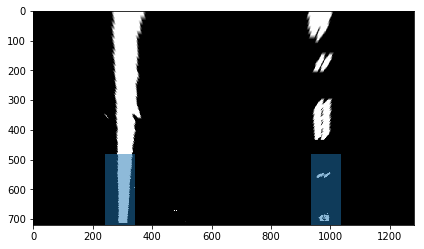

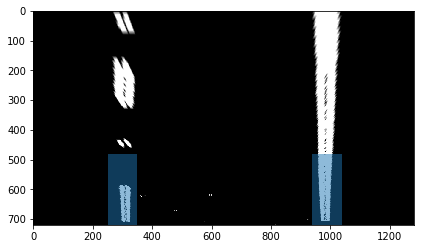

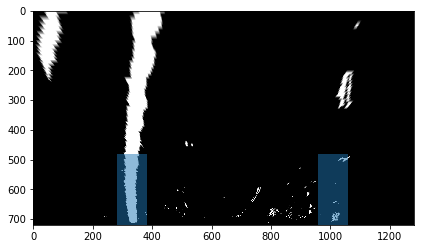

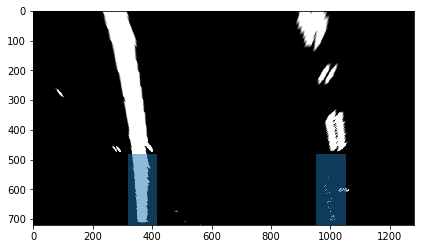

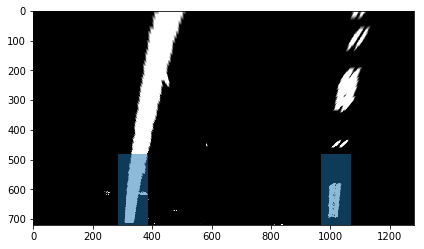

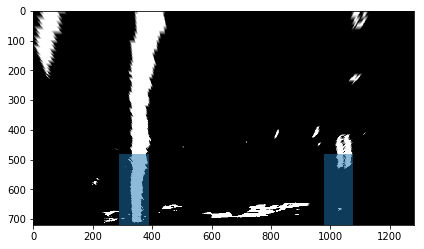

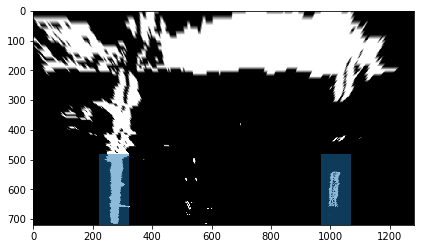

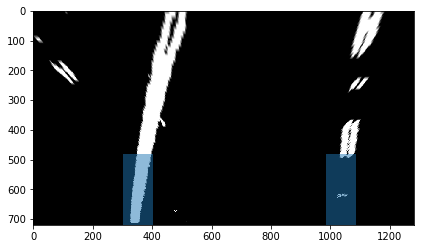

In [26]:
import matplotlib.patches as patches

binaries = glob.glob('./output_images/transformed_images/*.bmp')
ratio = 2/3
offset = 50  
for fname in binaries:
    nRows = img.shape[0]
    img = cv2.imread(fname)[:,:,0]
    histogram = np.sum(img[np.int(nRows*ratio):,:], axis=0)
    mid = np.int(img.shape[1]/2)
    leftBase = np.argmax(histogram[:mid])
    rightBase = np.argmax(histogram[mid:]) + mid
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(img,cmap='gray')
    ax1.add_patch(patches.Rectangle((leftBase-offset,np.int(ratio*nRows)),2*offset,nRows-np.int(ratio*nRows),alpha=0.5))
    ax1.add_patch(patches.Rectangle((rightBase-offset,np.int(ratio*nRows)),2*offset,nRows-np.int(ratio*nRows),alpha=0.5)) 
#     ax2 = fig.add_subplot(1,2,2)
#     plt.plot(histogram)


    
    
   

#### Find the lane with sliding window search (convolution)

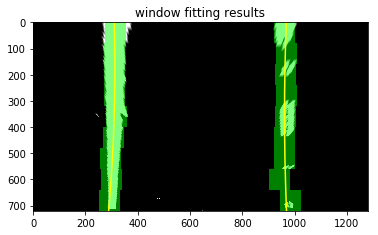

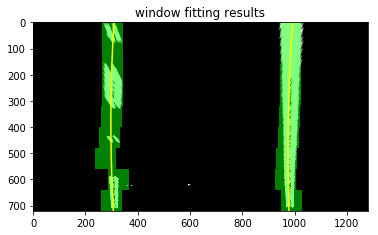

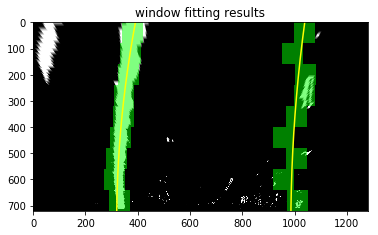

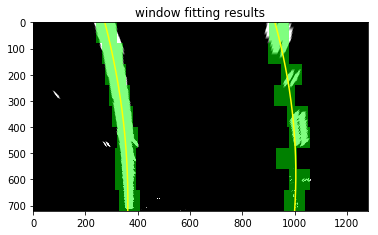

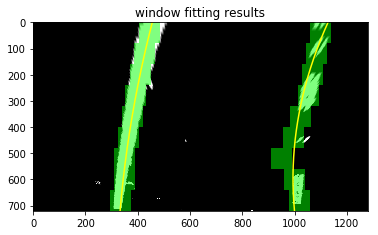

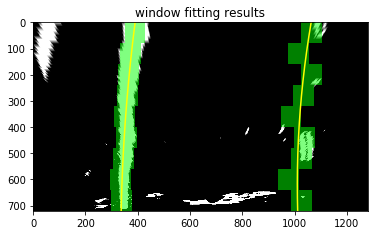

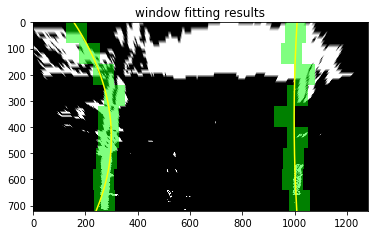

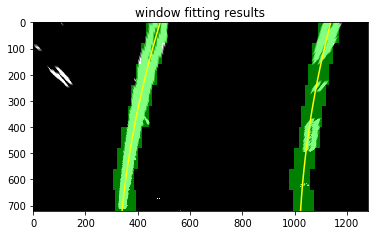

In [27]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin ,ratio):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum some ratio of the bottom of image to get slice
    nRows = image.shape[0]
    nCols = image.shape[1]
    histogram = np.sum(image[np.int(nRows*ratio):,:], axis=0)
    mid = np.int(nCols/2)
    leftBase = np.argmax(histogram[:mid])
    rightBase = np.argmax(histogram[mid:]) + mid
    
    # Add what we found for the first layer
    window_centroids.append((leftBase,rightBase))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(nRows/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(nRows-(level+1)*window_height):int(nRows-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(leftBase+offset-margin,0))
        l_max_index = int(min(leftBase+offset+margin,nCols))
        leftBase = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(rightBase+offset-margin,0))
        r_max_index = int(min(rightBase+offset+margin,nCols))
        rightBase = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((leftBase,rightBase))

    return window_centroids

# Read in a thresholded image
binaries = glob.glob('./output_images/transformed_images/*.bmp')
# window settings
window_width = 80 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 50 # How much to slide left and right for searching
ratio = 2/3

for fname in binaries:
    warped = cv2.imread(fname)[:,:,0]
    nRows = warped.shape[0]
    window_centroids = find_window_centroids(warped, window_width, window_height, margin, ratio)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template1 = np.array(cv2.merge((template,zero_channel,template)),np.uint8) # make window pixels green
        template2 = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output1 = cv2.addWeighted(warpage, 1, template1, -1, 0.0) # overlay the orignal road image with window results
        output2 = cv2.addWeighted(warpage, 1, template2,  1, 0.0) # overlay the orignal road image with window results
        output = cv2.addWeighted(output1, 0.5, output2, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    nonzeroLeft = l_points.nonzero()
    nonzeroRight = r_points.nonzero()
    leftx = np.array(nonzeroLeft[1])
    lefty = np.array(nonzeroLeft[0]) 
    rightx = np.array(nonzeroRight[1])
    righty = np.array(nonzeroRight[0])
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, nRows-1, nRows)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Display the final results
    fig = plt.figure()
    plt.imshow(output)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.title('window fitting results')
    plt.show()

#### Find the lane with sliding window search (average)

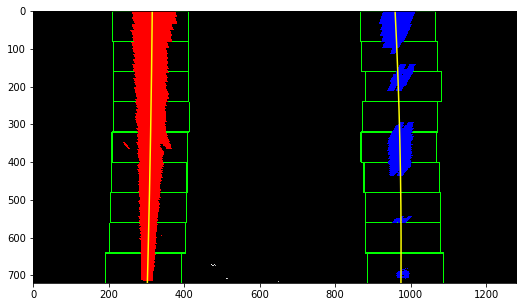

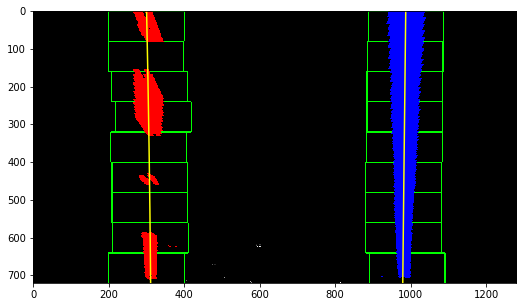

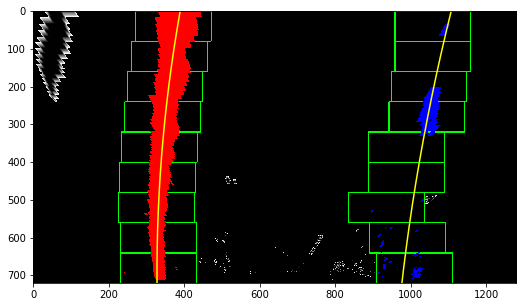

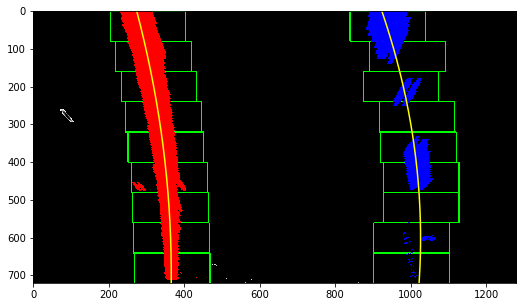

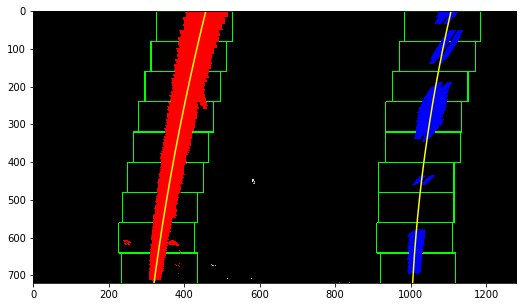

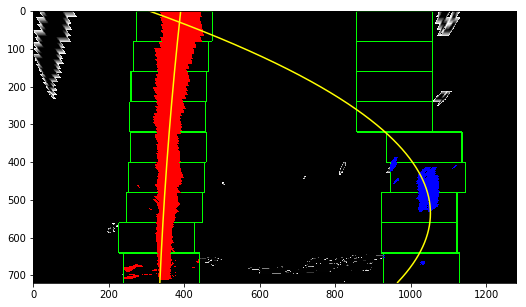

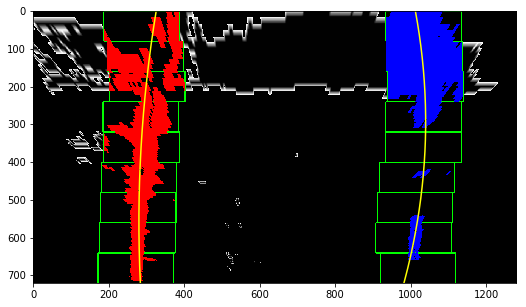

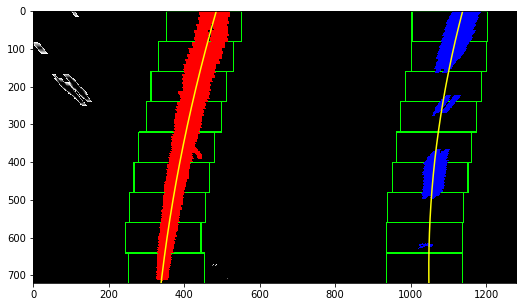

In [35]:
def find_lanes(warped,nwindows,margin,minpix,ratio):
    nRows = warped.shape[0]
    nCols = warped.shape[1]
    histogram = np.sum(warped[np.int(nRows*ratio):,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    mid = np.int(nCols/2)
    leftBase = np.argmax(histogram[:mid])
    rightBase = np.argmax(histogram[mid:]) + mid

    # Create an output image to draw on and  visualize the result

    # Set height of windows
    window_height = np.int(nRows/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftBase
    rightx_current = rightBase
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    out_img = np.dstack((warped, warped, warped))*255
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = nRows - (window+1)*window_height
        win_y_high = nRows - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds) 
    return left_lane_inds, right_lane_inds, nonzerox, nonzeroy, out_img

# Read in a thresholded image
binaries = glob.glob('./output_images/transformed_images/*.bmp')
# window settings
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
ratio = 2/3

for fname in binaries:
    warped = cv2.imread(fname)[:,:,0]
    
    # Find Lanes
    left_lane_inds, right_lane_inds, nonzerox, nonzeroy, out_img = find_lanes(warped,nwindows,margin,minpix,ratio)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, nRows-1, nRows)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    fig = plt.figure(figsize = (10,5))
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    imageName = fname.split('\\')[-1]
    plt.savefig('./output_images/fitted_images/' + imageName[:-3] + 'jpg')
    plt.show()

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [29]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

for fname in binaries:
    warped = cv2.imread(fname)[:,:,0]
    nRows = warped.shape[0]
    mid = warped.shape[1]/2
    
    # Find Lanes
    left_lane_inds, right_lane_inds, nonzerox, nonzeroy, out_img = find_lanes(warped,nwindows,margin,minpix,ratio)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, nRows-1, nRows)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculate the radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    
    offset = ((right_fitx[-1] + left_fitx[-1])/2 - mid) * xm_per_pix
    # Radius of curvature is in meters
    print(fname.split('\\')[-1] + ' curvatures: ', left_curverad, 'm', right_curverad, 'm', ' and offset: ', offset)

straight_lines1.bmp curvatures:  14398.7514659 m 4085.8425799 m  and offset:  -0.00715645468614
straight_lines2.bmp curvatures:  17264.6923333 m 145012.330359 m  and offset:  0.0283235593623
test1.bmp curvatures:  1282.65557317 m 1771.85340673 m  and offset:  0.0675042436364
test2.bmp curvatures:  871.492581588 m 579.949285145 m  and offset:  0.286989284458
test3.bmp curvatures:  2110.75921357 m 1349.00463365 m  and offset:  0.122218112161
test4.bmp curvatures:  3628.35789826 m 64.7076516787 m  and offset:  0.056744995712
test5.bmp curvatures:  1119.08105938 m 520.484068688 m  and offset:  -0.0344942662443
test6.bmp curvatures:  1376.86510423 m 852.407153608 m  and offset:  0.285088708048


## 7. Draw on images 

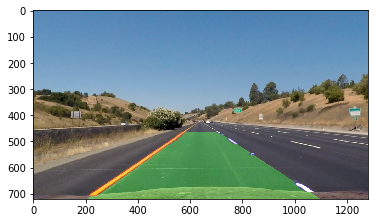

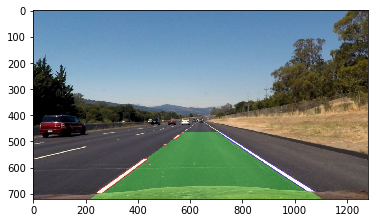

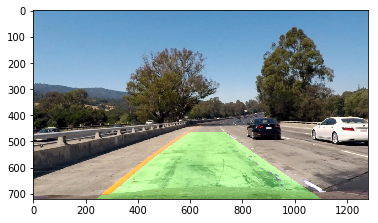

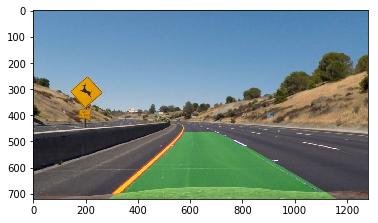

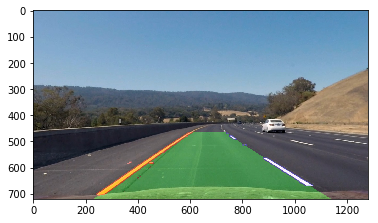

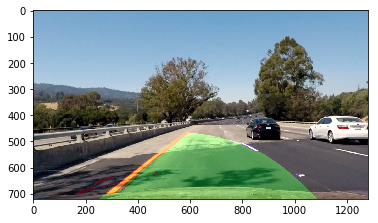

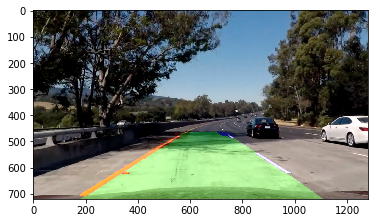

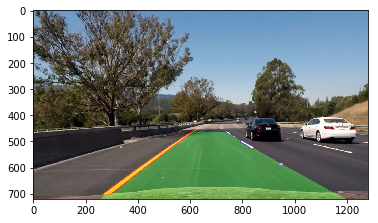

In [30]:
binaries = glob.glob('./output_images/transformed_images/*.bmp')
width = 20

for fname_bin in binaries:
    imageName = (fname_bin.split('\\')[-1])[:-3] + 'jpg'
    fname_un = './output_images/undistorted_test_images/' + imageName
    undistort = cv2.imread(fname_un)
    warped = cv2.imread(fname_bin)[:,:,0]
    nRows = warped.shape[0]
    nCols = warped.shape[1]
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Find Lanes
    left_lane_inds, right_lane_inds, nonzerox, nonzeroy, out_img = find_lanes(warped,nwindows,margin,minpix,ratio)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, nRows-1, nRows)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
#     # Recast the x and y points into usable format for cv2.fillPoly()
#     pts_left_left = np.array([np.transpose(np.vstack([left_fitx-width, ploty]))])
#     pts_left_right = np.array([np.flipud(np.transpose(np.vstack([left_fitx+width, ploty])))])
#     pts_left = np.hstack((pts_left_left, pts_left_right))
    
#     # Recast the x and y points into usable format for cv2.fillPoly()
#     pts_right_left = np.array([np.transpose(np.vstack([right_fitx-width, ploty]))])
#     pts_right_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx+width, ploty])))])
#     pts_right = np.hstack((pts_right_left, pts_right_right))
  
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    color_warp[lefty,leftx,:] = [0,0,255]
    color_warp[righty,rightx,:] = [255,0,0]

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistort, 1, newwarp, 0.3, 0)
    plt.figure()
    plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
    
    cv2.imwrite('./output_images/final_images/' + imageName, result)